#   Cox–Ingersoll–Ross process

The purpose of this notebook is to provide an illustration of the [Cox-Ingersoll-Ross Processs](https://en.wikipedia.org/wiki/Cox–Ingersoll–Ross_model) and some of its main properties. 

![image](_static/vasicek.png)

## Definition

The Cox-Ingersoll-Ross (CIR) model describes the dynamics of interest rates via a stochastic process which can be defined by the following Stochastic Differential Equation (SDE)


\begin{equation}
dX_t = \theta (\mu - X_t) dt + \sigma \sqrt{X_t} dW_t, \quad t >0,
\end{equation}


with initial condition  $X_0 =x_0\in\mathbb{R}$, and where $W_t$ is a standard Brownian motion, and the three parameters are constants:

- $\theta>0$ : speed or mean reversion coefficient 
- $\mu \in \mathbb{R}$ : long term mean
- $\sigma>0$ : volatility

### Existence and Uniqueness 

In order to demonstrate that equation (5.1) has a solution we need to introduce the following result which can be found in []

```{Theorem}
if then
```

Now, consider the following SDE 

\begin{equation}
dX_t = \theta (\mu - X_t) dt + \sigma \sqrt{|X_t|} dW_t, \quad t >0,
\end{equation}

with the same  initial condition and constant parameters as in (5.2). The only difference is in the diffusion coefficient where we are taking absolute value inside the square root.


Now that we are sure that our process exists, let us set the function $f(t,x) = x e^{\theta t}$. This is exactly the same as what we did for the Vasicek process. Then, Ito's formula implies


\begin{align*}
X_te^{\theta t} &= x_0 +\int_0^t X_s \theta e^{\theta s}ds + \int_0^t e^{\theta s}dX_s \\

&= x_0 +\int_0^t X_s \theta e^{\theta s}ds + \int_0^t e^{\theta s}[\theta (\mu - X_s) ds + \sigma \sqrt{X_s} dW_s], \\
& = x_0 + \int_0^t \left[ \theta X_s  e^{\theta s}  +\theta e^{\theta s}(\mu - X_s)\right] ds + \int_0^t e^{\theta s}\sigma\sqrt{X_s} dW_s\\
& = x_0 + \int_0^t \left[ \theta e^{\theta s}\mu\right] ds + \int_0^t e^{\theta s}\sigma \sqrt{X_s} dW_s\\
& = x_0 + \mu(e^{\theta t} - 1) + \int_0^t e^{\theta s}\sigma \sqrt{X_s} dW_s.
\end{align*}


Thus

\begin{equation}
X_t = x_0e^{-\theta t} +  \mu(1- e^{-\theta t})  + \sigma \int_0^t e^{-\theta (t-s)}  \sqrt{X_s} dW_s.
\end{equation}

```{note}
📝 We have not solve the equation explicitely since $X_s$ is still present in the integral with respect to the Brownian motion.
However, this expression allows us to calculate the expectation and variance of the marginal $X_t$.
```


Consider a Vacisek process with $\mu=0$, i.e. 
\begin{equation}
dr_t = - \theta r_t dt + \sigma  dW_t, \quad t >0,
\end{equation}
wi

and take $f(r)= r^2$.Ito's formula implies

\begin{align*}
r_t^2 &= r_0^2 + \int_0^t 2r_s dr_s + \dfrac{1}{2} \int_0^t 2 d \langle r \rangle_s \\
&= r_0^2 + \int_0^t 2r_s  [- \theta r_s ds + \sigma  dW_s] + \dfrac{1}{2} \int_0^t 2 \sigma^2 ds \\
&= r_0^2 + \int_0^t (\sigma^2 - 2\theta r_s^2 )ds+ \int_0^t 2\sigma  r_t   dW_s,
\end{align*}

or equivalently 

\begin{align*}
d r_t^2 &= (\sigma^2 - 2\theta r_t^2 )dt +  2\sigma  r_t   dW_t,
\end{align*}

which we can write as

\begin{align*}
d r_t^2 &= (\sigma^2 - 2\theta r_t^2 )dt +  2\sigma  \sqrt{ r_t^2 }   dW_t,
\end{align*}

\begin{align*}
d X_t   &= (\sigma^2 - 2\theta X_t )dt +  2\sigma  \sqrt{X_t}   dW_t\\    
        &= 2\theta \left(\dfrac{\sigma^2}{2\theta } - X_t \right)dt +  2\sigma  \sqrt{X_t}   dW_t,
\end{align*}

\sigma = \sigma/2

\sigma^2 = \sigma^2/4

\theta = \theta/2

$$dX_t = \theta  \left( \dfrac{\sigma^2}{4\theta}  - X_t  \right) dt + \sigma \sqrt{X}dW_t$$

### Expectation and Variance

\begin{equation*}
\mathbf{E} [X_t ] = x_0e^{-\theta t} +  \mu(1- e^{-\theta t}),
\end{equation*}

and

\begin{equation*}
\mathbf{Var} [X_t ] = \dfrac{\sigma^2}{\theta} x_0  (e^{ -\theta t} - e^{ -2\theta t} ) + \dfrac{\mu \sigma^2}{2\theta}(1 - e^{ -\theta t} )^2.
\end{equation*}

To calculate the expectation of $X_t$ we  simply use the linearity of the expectation and the fact that the Ito integral is a martingale. This allows us to obtain:
\begin{equation}
\mathbf{E} [X_t] = x_0e^{-\theta t} +  \mu(1- e^{-\theta t}).
\end{equation}

```{note}
📝 The expectation of the marginals match the ones from the Vasicek process.
```

For the variance, we have
\begin{align*}
\mathbf{Var} [X_t] &=   \mathbf{E}[X_t^2] - \mathbf{E}[X_t]^2 \\
 & =   \mathbf{E} \left[ \left(x_0e^{-\theta t} +  \mu(1- e^{-\theta t}) + \sigma \int_0^t e^{-\theta (t-s)}  \sqrt{X_s} dW_s \right)^2 \right]  - \left( x_0e^{-\theta t} +  \mu(1- e^{-\theta t}) \right)^2\\
& =\left(x_0e^{-\theta t} +  \mu(1- e^{-\theta t}) \right)^2 +  2 \mathbf{E} \left[\left(x_0e^{-\theta t} +  \mu(1- e^{-\theta t}) \right)  \sigma \int_0^t e^{-\theta (t-s)}  \sqrt{X_s} dW_s  \right ]  + \sigma^2 \mathbf{E} \left[ \left( \int_0^t e^{-\theta (t-s)}  \sqrt{X_s} dW_s \right)^2 \right] \\
& \ \  - \left( x_0e^{-\theta t} +  \mu(1- e^{-\theta t}) \right)^2\\
&= 2 \mathbf{E} \left[\left(x_0e^{-\theta t} +  \mu(1- e^{-\theta t}) \right)  \sigma \int_0^t e^{-\theta (t-s)}  \sqrt{X_s} dW_s  \right ]  + \sigma^2 \mathbf{E} \left[ \left( \int_0^t e^{-\theta (t-s)}  \sqrt{X_s} dW_s \right)^2 \right] \\
&= 2 \left(x_0e^{-\theta t} +  \mu(1- e^{-\theta t}) \right)e^{-\theta t}  \sigma\mathbf{E} \left[ \int_0^t e^{\theta s}  \sqrt{X_s} dW_s  \right ]  + \sigma^2 \mathbf{E} \left[  \int_0^t e^{-2\theta (t-s)}  X_s ds  \right],
\end{align*}
where the last equality follows by taking all non-stochastic terms out of the expectation in the first term and using isommetry property of the Ito integral in the second term. Next, we use that the Ito integral w.r.t. Brownian motion is a martingale to obtain
\begin{align*}
\mathbf{Var} [X_t] &= \sigma^2 e^{-2\theta t}\mathbf{E} \left[  \int_0^t e^{-2\theta s}  X_s ds  \right]\\
&= \sigma^2 e^{-2\theta t} \int_0^t e^{2\theta s} \mathbf{E} \left[  X_s  \right] ds\\
&= \sigma^2 e^{-2\theta t} \int_0^t e^{2\theta s}  \left[   x_0e^{-\theta s} +  \mu(1- e^{-\theta s}) \right] ds\\
&= \sigma^2 e^{-2\theta t} \int_0^t [  (x_0 - \mu) e^{\theta s} + \mu e^{ 2\theta s} ]ds\\
&= \sigma^2 e^{-2\theta t} \left[ (x_0 - \mu) \dfrac{1}{\theta}(e^{\theta t} -1 ) + \dfrac{1}{2 \theta} \mu (e^{ 2\theta t} -1 ) \right]\\
&= \dfrac{\sigma^2}{\theta} \left[ (x_0 - \mu) (e^{ -\theta t} - e^{ -2\theta t} ) + \dfrac{1}{2 } \mu (1 -e^{ -2\theta t}  ) \right]\\
&= \dfrac{\sigma^2}{\theta} \left[ x_0  (e^{ -\theta t} - e^{ -2\theta t} ) + \dfrac{\mu}{2}(2e^{ -2\theta t}  - 2e^{-\theta t}  +1 -e^{ -2\theta t}  ) \right]\\
&= \dfrac{\sigma^2}{\theta} \left[ x_0  (e^{ -\theta t} - e^{ -2\theta t} ) + \dfrac{\mu}{2}(e^{ -2\theta t}  - 2e^{-\theta t}  +1  ) \right]\\
&= \dfrac{\sigma^2}{\theta} \left[ x_0  (e^{ -\theta t} - e^{ -2\theta t} ) + \dfrac{\mu}{2}(1 - e^{ -\theta t} )^2 \right]\\
&= \dfrac{\sigma^2}{\theta} x_0  (e^{ -\theta t} - e^{ -2\theta t} ) + \dfrac{\mu \sigma^2}{2\theta}(1 - e^{ -\theta t} )^2.
\end{align*}

```{note}
📝 The second term in the last expression is equal to the variance of the marginal from a  Vasicek process multiplied by $\mu$. 
```

### Covariance 

tbd

## Marginal Distributions

The marginal distribution is a non-central Chi squared

### Python Implementation

So, for given $x_0, \theta>0, \mu, \sigma>0$ and $t,s>0$ we can implement the above formulas for the expectation, variance, and covariance as follows. 

In [1]:
import numpy as np

x0 = 2.0
theta = 1.0
mu = 3.0
sigma = 0.5
t= 1.0
s = 5

exp = x0*np.exp(-1.0*theta*t) +  mu*(1.0 - np.exp(-1.0*theta*t))
var = (sigma**2/theta)*x0*(np.exp(-1.0*theta*t)- np.exp(-2.0*theta*t)) + (mu*sigma**2/(2.0*theta))*(1 - np.exp(-1.0*theta*t))**2 
#cov = sigma**2/(2.0*theta)*np.exp(-1.0*(t+s))*(np.exp(2.0*theta*(np.min([t,s]))) - 1.0) 

print(f'For x_0={x0}' , f'theta={theta}',f'mu={mu}', f'sigma=.{sigma}', f't={t}', f's={s}', sep=", ")
print(f'E[X_t]= {exp: .6f}')
print(f'Var[X_t]={var :.6f}')
#print(f'Cov[X_t, X_s]={cov :.6f}')

For x_0=2.0, theta=1.0, mu=3.0, sigma=.0.5, t=1.0, s=5
E[X_t]=  2.632121
Var[X_t]=0.266113


### Marginal Distributions in Python

Knowing the distribution –with its corresponding parameters– of the marginal distributions allows us to reproduce them with `Python`. 

One way to do this is by using the object  `norm`  from the library `scipy.stats`.  The next cell shows how to create $X_1$ using this method.

In [2]:
from scipy.stats import norm
import numpy as np 


x0 = 2.0 
theta = 1.0
mu = 3.0
sigma = 0.5
t =1.0 

X_1 = norm(loc=(x0*np.exp(-1.0*theta*t)  + mu*(1.0 - np.exp(-1.0*theta*t))), 
           scale= np.sqrt( (sigma**2/(2.0*theta)*(1 - np.exp(-2.0*theta*t)) )) )

# Now we can calculate the mean and the variance of X_1
print(X_1.mean()) 
print(X_1.var())

2.6321205588285577
0.1080830895954234


Another way to do this is by creating an object  `CIR` from `aleatory.processes` and calling the method `get_marginal` on it. The next cell shows how to create the marginal $X_1$ using this method.

In [3]:
from aleatory.processes import CIRProcess

x0 = 2.0 
theta = 1.0
mu = 3.0
sigma = 0.5
t =1.0 

process = CIRProcess(theta=theta, mu=mu, sigma=sigma, initial=x0)
X_1 = process.get_marginal(t=1)

# Now we can calculate the mean and the variance of X_1
print(X_1.mean())
print(X_1.var())

2.632120558828558
0.2661132293025628


Hereafter, we will use the latter method to create marginal distributions from the Vacisek process.

### Probability Density Functions

The probability density function (pdf) of the marginal distribution $X_t$ is given by the following expression
\begin{equation*}
f(x, t; \theta,  \mu, \sigma) =  x\in\mathbb{R}, t>0.
\end{equation*}

Let's take a look at the density function of $X_1$ for different values of $\theta$, $\mu$, and $\sigma$.

In [4]:
import matplotlib.pyplot as plt

In [5]:
plt.style.use("seaborn-v0_8-whitegrid")
plt.rcParams["figure.figsize"] = (12, 6)
%config InlineBackend.figure_format ='retina'

First we consider the process
`CIRProcess(theta=1.0, mu=10.0, sigma=0.5, initial=1.0)` and plot the marginal density of $X_1$. Note how the mean is still far from the long term mean $\mu$.

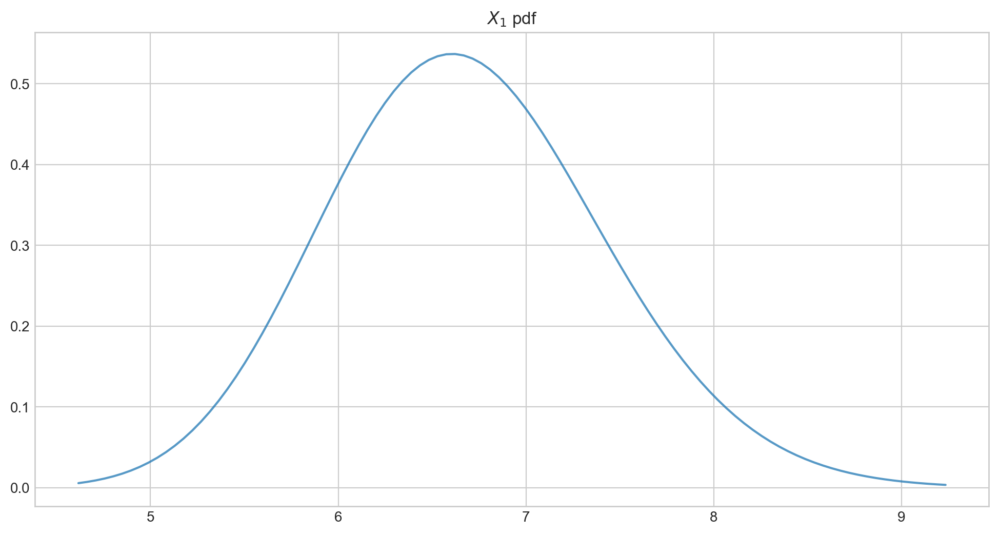

In [7]:
process = CIRProcess(theta=1.0, mu=10.0, sigma=0.5, initial=1.0)
X_1 = process.get_marginal(t=1)
x = np.linspace(X_1.ppf(0.001), X_1.ppf(0.999), 100)
plt.plot(x, X_1.pdf(x), '-', lw=1.5, alpha=0.75, label=f'$t$={1:.2f}')
plt.title(f'$X_1$ pdf')
plt.show()

Next we vary the value of the parameter $\theta$ (the speed of reversion)  ``CIRProcess(theta=1.0, mu=10.0, sigma=0.5, initial=1.0)`` and again plot the densities of $X_1$. Note how the value of $\theta$ impacts both the mean and the variance of the density. 

As $\theta$ increases:

-  The expectation goes from being close to the initial point $x_0 = 1.0$ to being close to the long term mean $\mu=10.0$.
-  The variance decreases and the distribution becomes more concentrated around the mean.

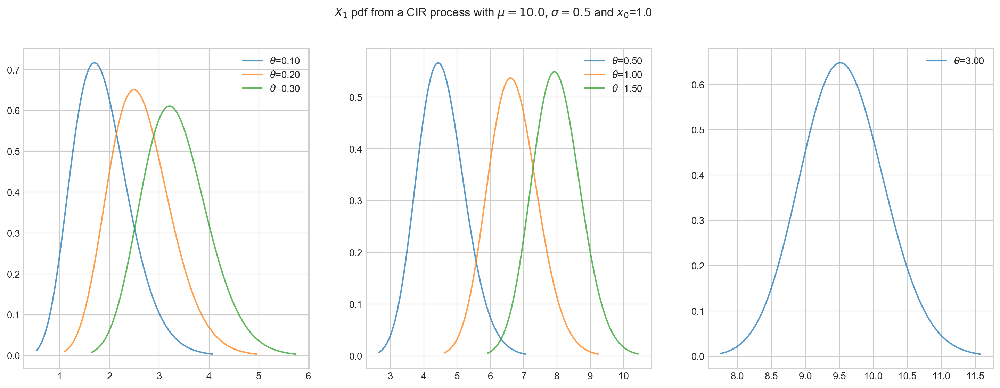

In [8]:
fig, axs = plt.subplots(1, 3, figsize=(18, 6))
theta_values = ( [0.1, 0.2, 0.3], [0.5, 1, 1.5], [3.0])
for (thetas, ax) in zip(theta_values, axs):
    for theta in thetas:
        process = CIRProcess(theta=theta, mu=10.0, sigma=0.5, initial=1.0)
        X_t = process.get_marginal(t=1.0)
        x = np.linspace(X_t.ppf(0.001), X_t.ppf(0.999), 100)
        ax.plot(x, X_t.pdf(x), '-', lw=1.5,
                alpha=0.75, label=f'$\\theta$={theta:.2f}')
        ax.legend()
fig.suptitle(r'$X_1$ pdf from a CIR process with $\mu = 10.0, \sigma=0.5$ and $x_0$=1.0')
plt.show()

Next we vary the value of the parameter $\mu$ (the long term mean) in  `CIRProcess(theta=1.0, mu=mu, sigma=0.5, initial=1.0)` and again plot the densities corresponding to $X_1$. Note how the value of $\mu$ impacts only the mean of the density. We can see that the mean of the density follows the direction of the parameter $\mu$ which is expected since it will converge to it when $t$ goe to infinity.

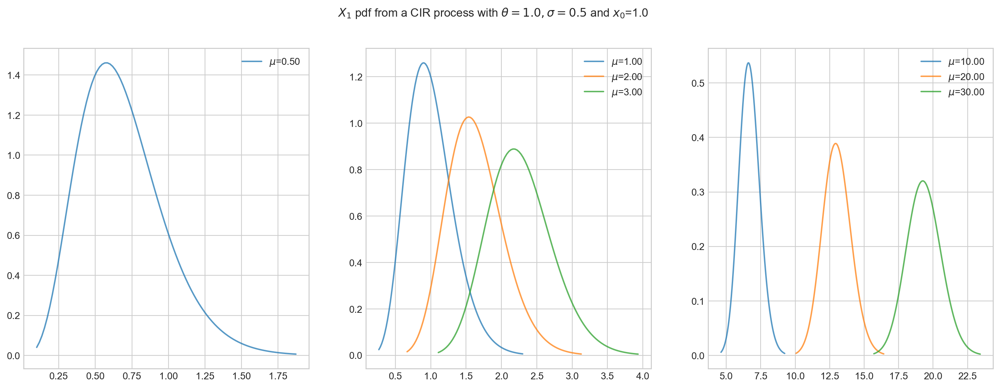

In [10]:
fig, axs = plt.subplots(1, 3, figsize=(18, 6))
mu_values = ([ 0.5], [1,2,3], [10, 20, 30])
for (mus, ax) in zip(mu_values, axs):
    for mu in mus:
        process = CIRProcess(theta=1.0, mu=mu, sigma=0.5, initial=1.0)
        X_t = process.get_marginal(t=1.0)
        x = np.linspace(X_t.ppf(0.001), X_t.ppf(0.999), 100)
        ax.plot(x, X_t.pdf(x), '-', lw=1.5,
                alpha=0.75, label=f'$\mu$={mu:.2f}')
        ax.legend()
fig.suptitle(r'$X_1$ pdf from a CIR process with $\theta = 1.0, \sigma=0.5$ and $x_0$=1.0')
plt.show()


Next we vary the value of the parameter $\sigma$ (the volatility) in  `CIRProcess(theta=1.0, mu=10.0, sigma=sigma, initial=1.0)` and again plot the densities of $X_1$. Note that the value of $\sigma$ impacts only the variance of the density while the mean remains constant. As $\sigma$ increases the variance of $X_1$ increases and the distribution becomes wider. We can see this by looking at the range in the x-axis of the plots.

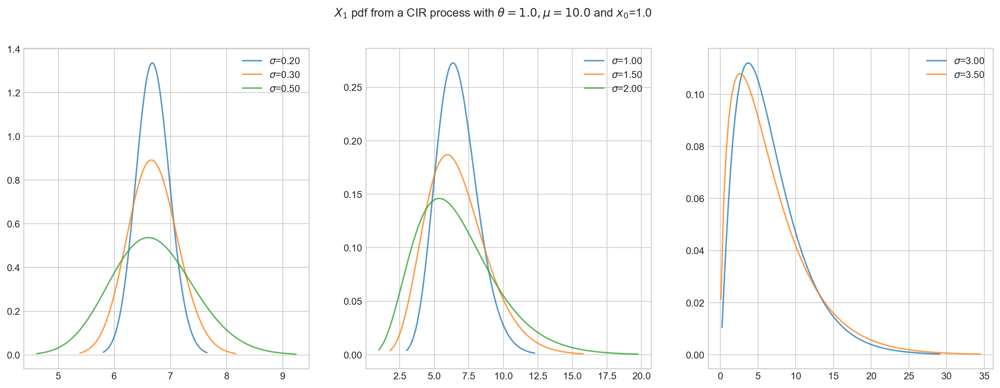

In [16]:
fig, axs = plt.subplots(1, 3, figsize=(18, 6))
sigma_values = ([ 0.2, 0.3, 0.5], [1, 1.5, 2.], [3,3.5])
for (sigmas, ax) in zip(sigma_values, axs):
    for sigma in sigmas:
        process = CIRProcess(theta=1.0, mu=10.0, sigma=sigma, initial=1.0)
        X_t = process.get_marginal(t=1.0)
        x = np.linspace(X_t.ppf(0.001), X_t.ppf(0.999), 100)
        ax.plot(x, X_t.pdf(x), '-', lw=1.5,
                alpha=0.75, label=f'$\sigma$={sigma:.2f}')
        ax.legend()
fig.suptitle(r'$X_1$ pdf from a CIR process with $\theta = 1.0, \mu=10.0$ and $x_0$=1.0')
plt.show()


Finally, we will keep all parameters fixed in `CIRProces(theta=1.0, mu=10.0, sigma=0.5, initial=1.0)` and now plot the densities of $X_t$ for several values of $t$. Note how varying $t$ would impact both the mean and the variance of the density. 

As $t$ increases:

-  The expectation goes from being close to the initial point $x_0 = 1.0$ to being close to the long term mean $\mu=10.0$.
-  The variance also increases but note that it seems to stabilise. We can see this especially in the third graph.

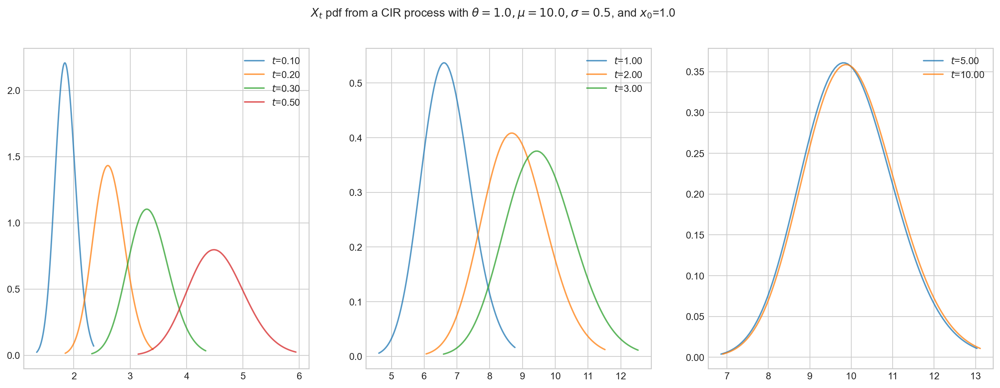

In [18]:
process = CIRProcess(theta=1.0, mu=10.0, sigma=0.5, initial=1.0)
fig, axs = plt.subplots(1, 3, figsize=(18, 6))
t_values = ([0.1, 0.2,  0.3, 0.5], [1, 2, 3], [5,10])
for (ts, ax) in zip(t_values, axs):
    for t in ts:
        X_t = process.get_marginal(t=t)
        x = np.linspace(X_t.ppf(0.001), X_t.ppf(0.995), 100)
        ax.plot(x, X_t.pdf(x), '-', lw=1.5,
                alpha=0.75, label=f'$t$={t:.2f}')
        ax.legend()
fig.suptitle(r'$X_t$ pdf from a CIR process with $\theta = 1.0, \mu=10.0, \sigma=0.5$, and $x_0$=1.0')
plt.show()


### Sampling

Now, let's see how to get a random sample from $X_t$ for any  $t>0$. 

The next cell shows how to get a sample of size 5 from $X_1$.

In [19]:
from aleatory.processes import Vasicek

process = CIRProcess(theta=1.0, mu=10.0, sigma=0.5, initial=1.0)
X_1= process.get_marginal(t=1.0)
X_1.rvs(size=5)

array([6.91046061, 6.14194378, 6.56266321, 6.14768368, 6.49623577])

Similarly, we can get a sample from $X_{10}$

In [20]:
X_10 = process.get_marginal(t=10)
X_10.rvs(size=5)

array([10.47387151,  9.6532266 , 12.00038082,  9.71084151, 10.87220347])

## Simulation


In order to simulate paths from a stochastic process, we need to set a discrete partition over an interval for the simulation to take place. 

For simplicity, we are going to consider an equidistant partition of size $n$ over $[0,T]$, i.e.:
\begin{equation*}
t_i = \frac{i}{n-1} T \qquad  \hbox{for } i = 0, \cdots, n-1.
\end{equation*}
Then, the goal is to simulate a path of the form $\{ X_{t_i} , i=0,\cdots, n-1\}$. We will use Euler-Maruyama approximation.

### Simulating and Visualising Paths

We can simulate several paths from a Vasicek process and visualise them we can use the method `plot` from the `aleatory` library. 


Let's simulate 10 paths over the interval $[0,1]$ using a partition of 100 points. 



`````{admonition} Tip
:class: tip
Remember that  the number of points in the partition is defined by the parameter $n$, while  the number of paths is determined by $N$.
`````

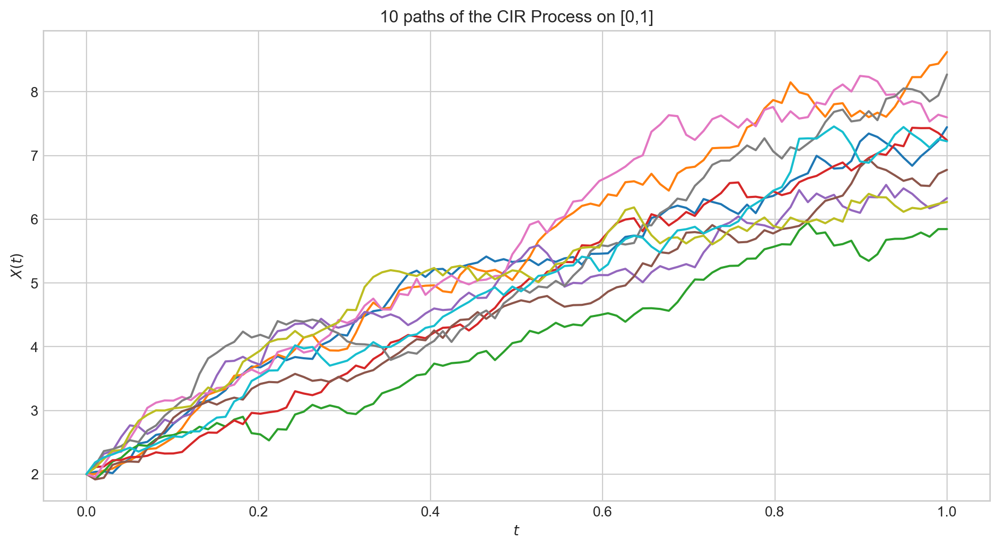

In [22]:
from aleatory.processes import CIRProcess

process = CIRProcess(theta=1.0, mu=10.0, sigma=0.5, initial=2.0)
process.plot(n=100, N=10, title='10 paths of the CIR Process on [0,1]')
plt.show()

```{note}
In all plots we are using a linear interpolation to draw the lines between the simulated points. 
```

Similarly, we can define the process over the interval $[0, 5]$ and simulate 50 paths with a partition of size 100.

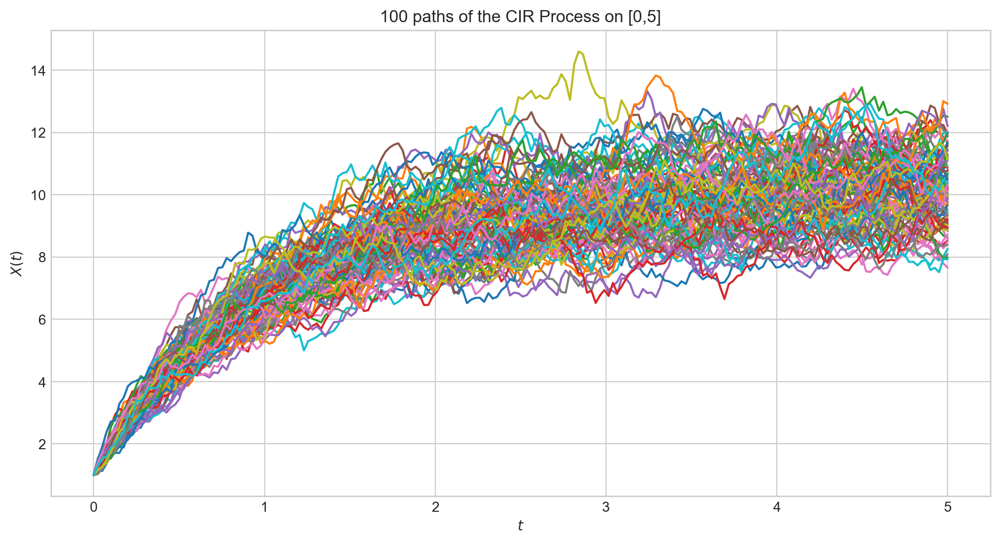

In [23]:
process = CIRProcess(theta=1.0, mu=10.0, sigma=0.5, initial=1.0, T=5.0)
process.plot(n=200, N=100, title='100 paths of the CIR Process on [0,5]')
plt.show()

## Long Time Behaviour 

### Expectation and Variance

Note that when $t$ goes to infinity, we have

\begin{equation*}
\lim_{t\rightarrow\infty}  \mathbf{E} [X_t ]  = \lim_{t\rightarrow\infty} \left[ x_0e^{-\theta t} +  \mu(1- e^{-\theta t}) \right] = \mu.
\end{equation*}
and
\begin{equation*}
\lim_{t\rightarrow\infty}\mathbf{Var} [X_t ]  = \lim_{t\rightarrow\infty} \dfrac{\sigma^2}{\theta} x_0  (e^{ -\theta t} - e^{ -2\theta t} ) + \dfrac{\mu \sigma^2}{2\theta}(1 - e^{ -\theta t} )^2 =  \frac{\mu  \sigma^2}{ 2\theta}.
\end{equation*}

Next, we illustrate the convergence of both the mean and the variance of $X_t$ as $t$ grows. Note that the speed of convergence is determined by $\theta$.

In [24]:
def draw_mean_variance(x0, theta, mu, sigma, T=100):

    process = CIRProcess(theta=theta, mu=mu, sigma=sigma, initial=x0, T=T)
    ts = np.linspace(0, T, T)
    means = process.marginal_expectation(ts)
    variances = process.marginal_variance(ts)
    fig, (ax1, ax2,) = plt.subplots(1, 2, figsize=(9, 4))
    
    ax1.plot(ts, means, lw=1.5, color='black', label='$E[X_t]$')
    ax1.set_xlabel('t')
    ax1.legend()
    ax2.plot(ts,  variances, lw=1.5, color='red', label='$Var[X_t]$')
    ax2.set_xlabel('t')
    ax2.legend()
    fig.suptitle(
        'Expectation and Variance of $X_t$ with ' f'$x_0$={x0:.2f}, $\\theta$={theta:.2f}, $\mu$={mu:.2f}, $\sigma$={sigma:.2f}', size=12)
    plt.show()

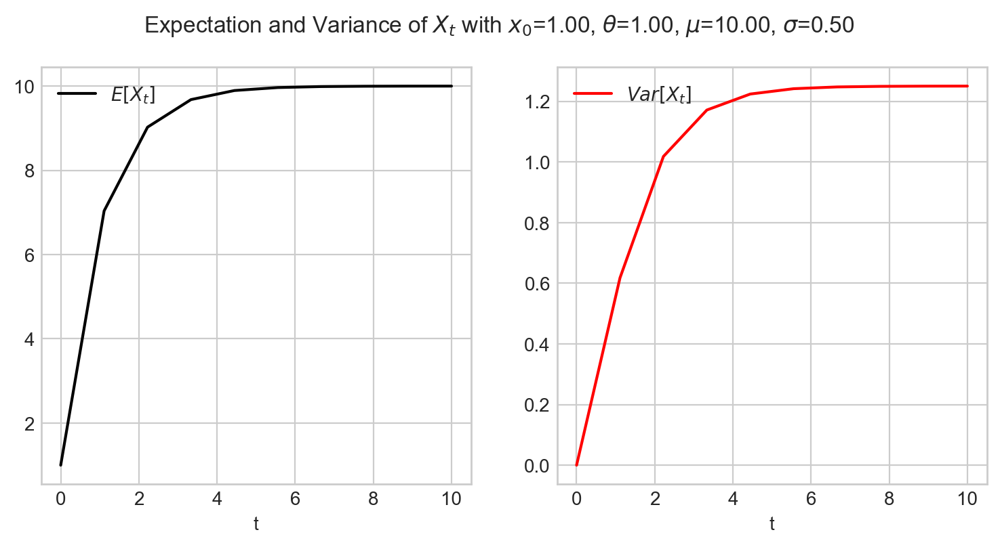

In [25]:
draw_mean_variance(theta=1.0, mu=10.0, sigma=0.5, x0=1.0, T=10)

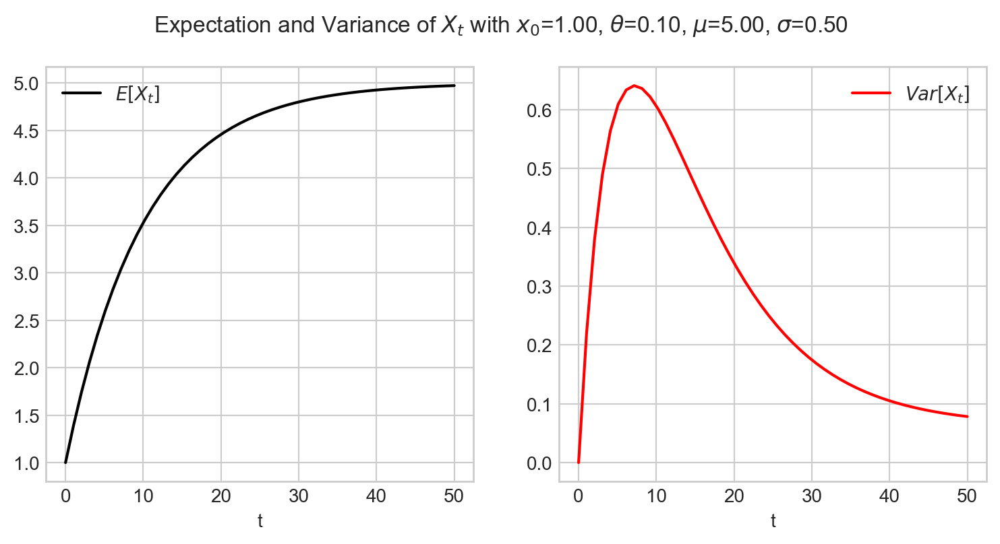

In [33]:
draw_mean_variance(theta=0.1, mu=5.0, sigma=0.5, x0=1.0, T=50)

### Marginal

The marginal distribution $X_t$ given an initial point $x_0$, converges to 
\begin{equation*}
X_{\infty} \sim,
\end{equation*}
as $t$ goes to infinity. Let's make some simulations to illustrate this convergence.


First, we simulate 1000 paths from `CIRProcess(theta=1.0, mu=10.0, sigma=2.0, initial=1.0, T=1.0)` over the interval $[0,1]$. Here, we can see the the distribution of $X_1$ has mean around 6.0. This means that the process has not reached convergence, since we have not arrived to the long term mean $\mu=10.0$. 

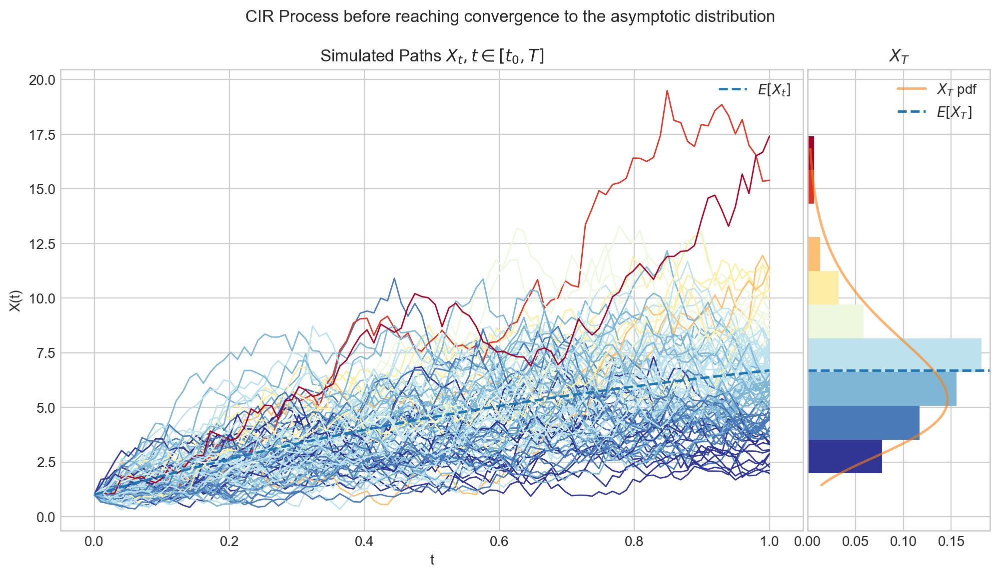

In [34]:
process = CIRProcess(theta=1.0, mu=10.0, sigma=2.0, initial=1.0, T=1.0)
process.draw(n=100, N=100, title='CIR Process before reaching convergence to the asymptotic distribution')
plt.show()

Now, we simulate 1000 paths from the same process `CIRProcess(theta=1.0, mu=10.0, sigma=2.0, initial=1.0, T=15)` but this time over the interval $[0,15]$. In the picture, we can see the the distribution of $X_{15}$ has mean equal to the long term mean $\mu=10$. The expectation has reached convergence!

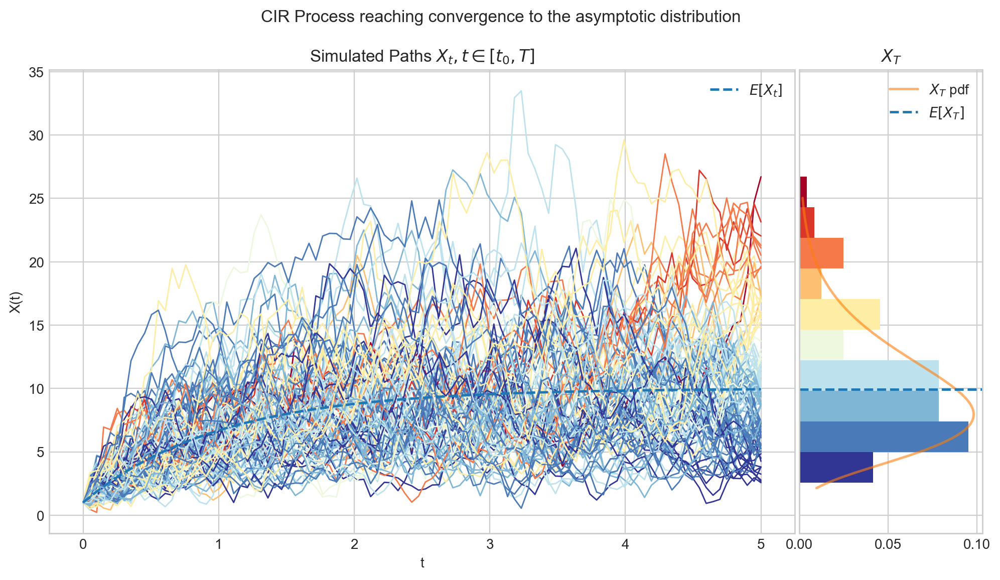

In [36]:
process = CIRProcess(theta=1.0, mu=10.0, sigma=2.0, initial=1.0, T=5.0)
process.draw(n=100, N=100, title='CIR Process reaching convergence to the asymptotic distribution')
plt.show()

#### The parameter $\theta$ determines the Speed of Convergence

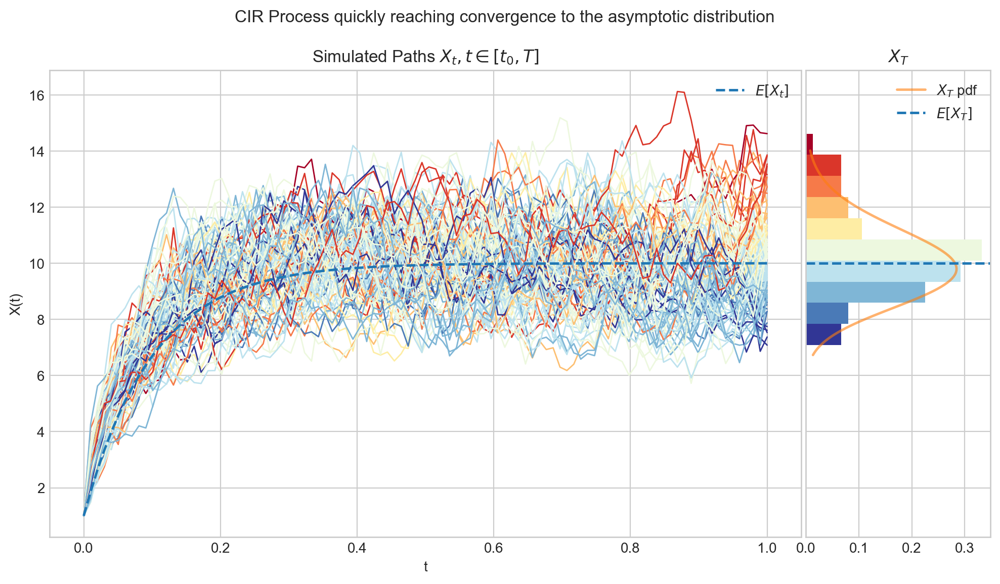

In [43]:
process = CIRProcess(theta=10.0, mu=10.0, sigma=2.0, initial=1.0, T=1.0)
process.draw(n=100, N=100, title='CIR Process quickly reaching convergence to the asymptotic distribution')
plt.show()

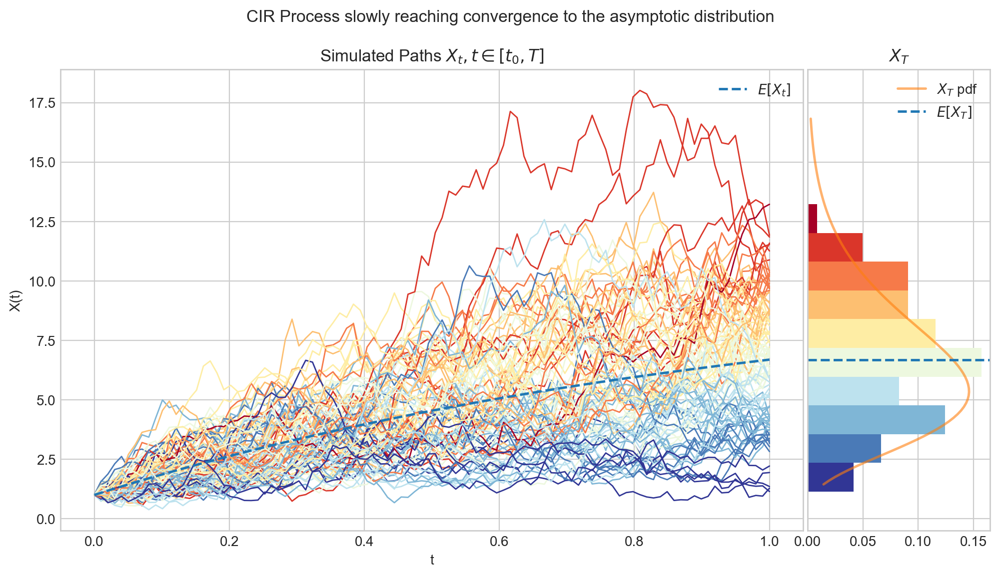

In [44]:
process = CIRProcess(theta=1.0, mu=10.0, sigma=2.0, initial=1.0, T=1.0)
process.draw(n=100, N=100, title='CIR Process slowly reaching convergence to the asymptotic distribution')
plt.show()

#### The parameter $\sigma$ determines the volatility in the simulation

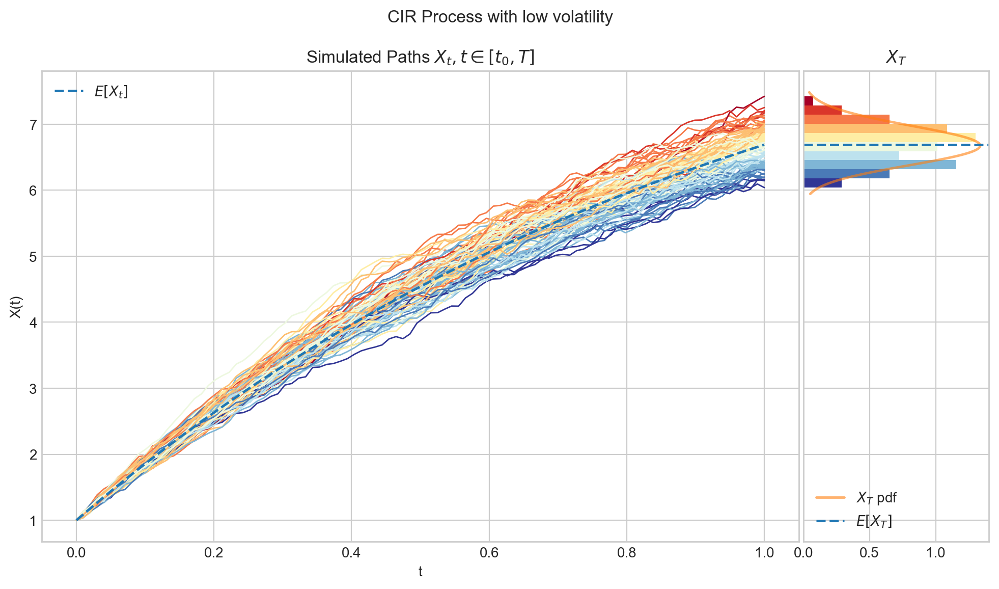

In [45]:
process = CIRProcess(theta=1.0, mu=10.0, sigma=0.2, initial=1.0, T=1.0)
process.draw(n=100, N=100, title='CIR Process with low volatility')
plt.show()

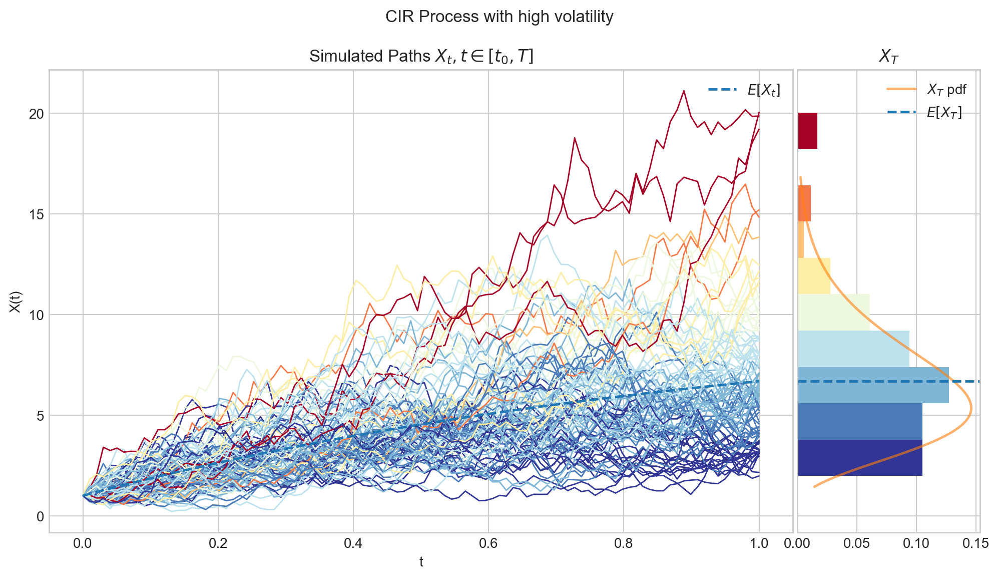

In [46]:
process = CIRProcess(theta=1.0, mu=10.0, sigma=2.0, initial=1.0, T=1.0)
process.draw(n=100, N=100, title='CIR Process with high volatility')
plt.show()

## Visualisation

To finish this note, let's take a final look at a some simulations from the Vasicek process.

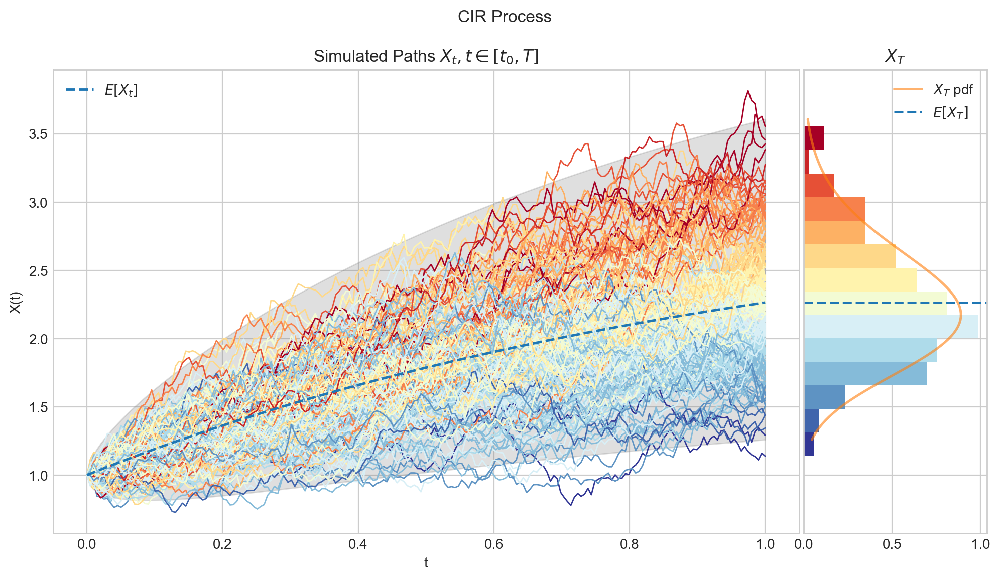

In [47]:
from aleatory.processes import CIRProcess
process = CIRProcess(theta=1.0, mu=3.0, sigma=0.5, initial=1.0, T=1.0)
process.draw(n=200, N=200, envelope=True)
plt.show()

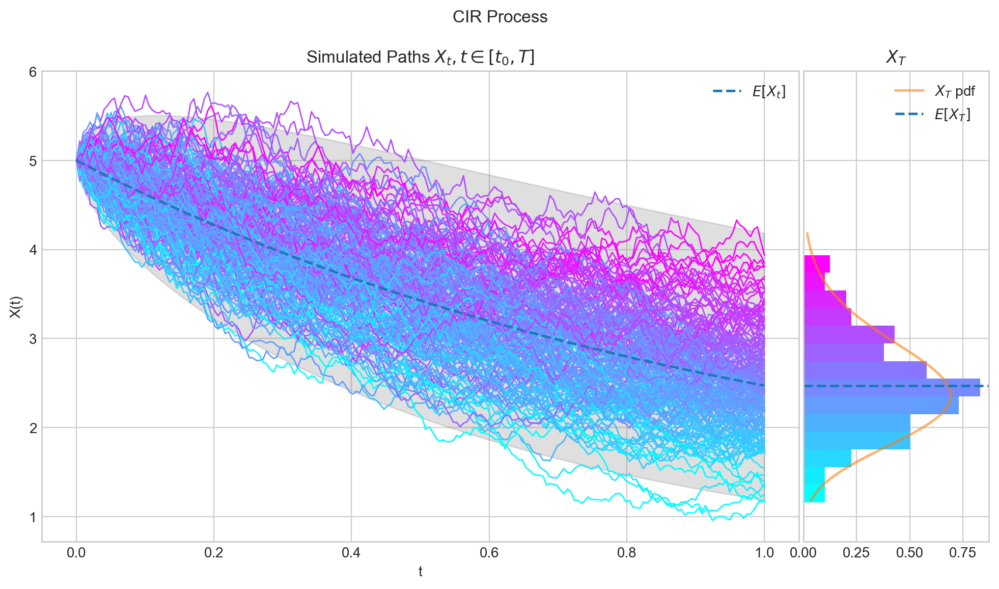

In [51]:
from aleatory.processes import Vasicek
process = CIRProcess(theta=1.0, mu=1.0, sigma=0.5, initial=5.0, T=1.0)
process.draw(n=200, N=200, envelope=True, colormap="cool", title='CIR Process')
plt.show()

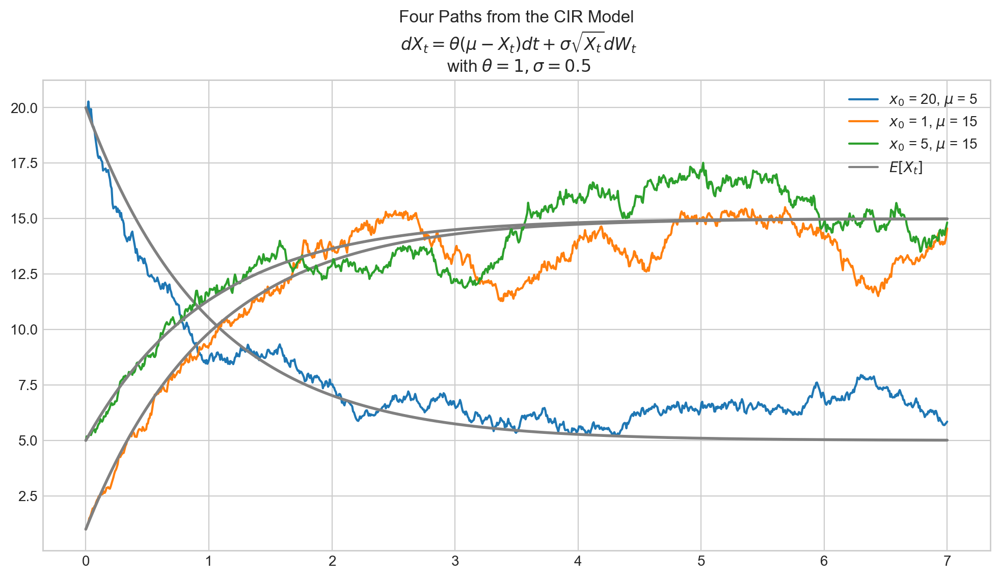

In [132]:
from aleatory.processes import CIRProcess
import matplotlib.pyplot as plt
import numpy as np

process = CIRProcess(theta=1.0, mu=5.0, sigma=0.5, initial=20.0, T=7.0)
path = process.simulate(n=1000, N=1)
ts = process.times
exp = process.marginal_expectation(ts)
plt.plot(ts, path[0], label= f'$x_0$ = 20, $\mu$ = 5')
plt.plot(ts, exp, color='grey',linewidth=2)

for x0 in [1.0, 5.0]:
    process = CIRProcess(theta=1.0, mu=15.0, sigma=0.5, initial=x0, T=7.0)
    path = process.simulate(n=1000, N=1)
    plt.plot(ts, path[0], label= f'$x_0$ = {x0:.0f}, $\mu$ = 15')
    exp = process.marginal_expectation(ts)
    plt.plot(ts, exp, color='grey', linewidth=2)
plt.plot(ts, exp, color='grey', label=f'$E[X_t]$')
plt.legend()
plt.title('Four Paths from the CIR Model\n $dX_t = \\theta(\mu - X_t) dt + \sigma \sqrt{X_t} dW_t$\n with $\\theta = 1, \sigma = 0.5$')
plt.show()

## References and Further Reading

